# This notebook will try to load simple litter survey data sample and try to train using it

In [1]:
%pip install ultralytics
import ultralytics
ultralytics.checks()

Ultralytics 8.3.57 🚀 Python-3.10.12 torch-2.0.1+cu117 CUDA:0 (NVIDIA GeForce RTX 3080 Ti, 12287MiB)
Setup complete ✅ (8 CPUs, 7.7 GB RAM, 158.6/1006.9 GB disk)


In [2]:
!ls /app/litter_survey_dataset  

 2024-07-21
'Annotation Batch 1 Kirkland 20231216'
'Annotation Batch 2 Kirkland 20250105'
'Annotation Batch 3 Bellevue Woodinville 20240721'
'Annotation Batch 4 Kirkland 20240310'
 SampleImageToAnnotate


In [3]:
!ls /app/examples  

README.md		       YOLOv8-OpenVINO-CPP-Inference
RTDETR-ONNXRuntime-Python      YOLOv8-Region-Counter
YOLO-Series-ONNXRuntime-Rust   YOLOv8-SAHI-Inference-Video
YOLOv8-Action-Recognition      YOLOv8-Segmentation-ONNXRuntime-Python
YOLOv8-CPP-Inference	       YOLOv8-TFLite-Python
YOLOv8-LibTorch-CPP-Inference  heatmaps.ipynb
YOLOv8-ONNXRuntime	       hub.ipynb
YOLOv8-ONNXRuntime-CPP	       object_counting.ipynb
YOLOv8-ONNXRuntime-Rust        object_tracking.ipynb
YOLOv8-OpenCV-ONNX-Python      tutorial.ipynb


### Check if you have GPU enabled

In [4]:
!python3 -c "import torch; print(torch.cuda.is_available())"

True


### Check if your docker container has all the necessary lib

In [5]:
import torch

In [6]:
import ultralytics

In [7]:
import cv2

In [8]:
print('Importing worked! You are all set!')

Importing worked! You are all set!


# Check if annotation files are generated

In [2]:
import os 
import os.path
import json 
labelme_json_template_path = '/app/litter_survey_dataset/2024-07-21/RayBan/photo-1007_singular_display_fullPicture.json'
labelme_json_template_json = {}
with open(labelme_json_template_path) as f:
    labelme_json_template_json=json.load(f)

In [12]:
labelme_json_template_json['imagePath'] 

'photo-1007_singular_display_fullPicture.jpeg'

In [3]:
import base64
VERBOSE = True 

def get_base64_str_from_jpg(file_path):
    # Step 1: Open the .jpg file in binary mode
    with open(file_path, 'rb') as image_file:
        # Step 2: Read the file's binary content
        image_binary = image_file.read()
    
    # Step 3: Encode the binary data into a Base64 string
    base64_str = base64.b64encode(image_binary).decode('utf-8')
    
    return base64_str

def log(msg:str, verbose:bool=False):
    if VERBOSE:
        print(msg)
    

In [39]:
data_batch_folders = [
    '/app/litter_survey_dataset/SampleImageToAnnotate',
    '/app/litter_survey_dataset/Annotation Batch 1 Kirkland 20231216',
    '/app/litter_survey_dataset/Annotation Batch 2 Kirkland 20250105',
    '/app/litter_survey_dataset/Annotation Batch 3 Bellevue Woodinville 20240721',
    '/app/litter_survey_dataset/Annotation Batch 4 Kirkland 20240310'
]

In [40]:
image_with_annotations = {}
ct_image = 0
ct_annotation = 0 
for batch_folder in data_batch_folders:
    images = os.listdir(batch_folder)
 
    for f in images:
        if (f.lower().endswith('.jpg') or f.lower().endswith('.jpeg') or f.lower().endswith('.png')) and '_resized.' not in f:
            image_with_annotations[f.split('.')[0]] = [f'{batch_folder}/{f}']
            ct_image+=1 
    for f in images:
        if f.lower().endswith('.json'):
            image_with_annotations[f.split('.')[0]].append(f'{batch_folder}/{f}')
    dataloop_annotations = os.listdir(f"{batch_folder}/dataloop_ddd_labels")
    for dataloop_json in dataloop_annotations:
        if dataloop_json.endswith('.json'):
            image_with_annotations[dataloop_json.split('.')[0]].append(f"{batch_folder}/dataloop_ddd_labels/{dataloop_json}")
            ct_annotation+=1
        
    

In [41]:
ct_image

1027

In [42]:
ct_annotation

988

In [37]:
import json 
from tqdm import tqdm
import time

label_types = ['Litter','Litter Centre','Grabber']
label_rejection_type = ['No Grabber']

# toggle to see full log
is_verbose = False 
VERBOSE = False

label_file_updated = 0 
for file_name, file_pairs in image_with_annotations.items():
    img_file = file_pairs[0]
    if len(file_pairs) < 3:
        log(msg=f'{img_file} has imcomplete label, skip!',verbose=is_verbose)
        continue 
    
    log(msg=img_file,verbose=is_verbose)
    labelme_json_file =  file_pairs[1]
    ddd_annotation_file = file_pairs[2]
    # with open(labelme_json_file, 'r') as file:
    #     labelme_json_from_file = json.load(file)

    # if 'imagePath' not in labelme_json.keys():
    #     labelme_json = labelme_json_template_json
    #     log(msg='need to use template',verbose=is_verbose)
    # else:    
    #     labelme_json = labelme_json_from_file

    labelme_json = labelme_json_template_json
    labelme_json['imagePath'] = img_file.split('/')[-1] 
    labelme_json['imageData'] = get_base64_str_from_jpg(img_file)
    
        
    with open(ddd_annotation_file, 'r') as file:
        ddd_json = json.load(file)
        if 'annotations' in ddd_json.keys():
            mapped_shapes = []
            for ddd_annotation in ddd_json['annotations']:
                annotation_type = ddd_annotation['type']
                annotation_label = ddd_annotation['label']
                log(msg=f'{annotation_type} {annotation_label}',verbose=is_verbose)

                if annotation_label not in label_rejection_type:
                    annotation_coordinates = ddd_annotation['coordinates'] 
                    annotation_metadata = ddd_annotation['metadata']['system']['attributes']
                    if annotation_label.lower() == 'litter':
                        log(msg=annotation_coordinates,verbose=is_verbose)
                        log(msg=annotation_metadata,verbose=is_verbose)
                        label_mapped = annotation_label + '-'+ annotation_metadata['1'] + '-' + annotation_metadata['2']
                        shape_type = 'rectangle'
                        points = [[annotation_coordinates[0]['x'], annotation_coordinates[0]['y']],[annotation_coordinates[1]['x'], annotation_coordinates[1]['y']]]
                    elif annotation_label == 'Litter Centre':
                        log(msg=annotation_coordinates,verbose=is_verbose)
                        label_mapped = annotation_label 
                        shape_type = 'point'
                        points = [[annotation_coordinates['x'], annotation_coordinates['y']]]
                    elif annotation_label == 'Grabber':
                        log(msg=annotation_coordinates,verbose=is_verbose)
                        label_mapped = annotation_label
                        shape_type = 'rectangle'
                        points = [[annotation_coordinates[0]['x'], annotation_coordinates[0]['y']],[annotation_coordinates[1]['x'], annotation_coordinates[1]['y']]]
                    log(msg=label_mapped,verbose=is_verbose)
                    log(msg=shape_type,verbose=is_verbose)
                    log(msg=points,verbose=is_verbose)
                    mapped_shape = {
                      "label": label_mapped,
                      "points": points,
                      "group_id": None,
                      "description": "",
                      "shape_type": shape_type,
                      "flags": {},
                      "mask": None
                    }
                    mapped_shapes.append(mapped_shape)

        



                if annotation_label not in label_types and annotation_label not in label_rejection_type:
                    raise Exception(f"{annotation_label} not supported!")
            # put mapped shape back into the local annotations 
            labelme_json['shapes'] = mapped_shapes
    with open(labelme_json_file, 'w') as file:
        json.dump(labelme_json, file, indent=4)
    with open(labelme_json_file.replace('/app/',''), 'w') as file:
        json.dump(labelme_json, file, indent=4)
    label_file_updated += 1

print('Done')
        

Done


In [38]:
label_file_updated

310

# Now try to load some image and run prediction

In [43]:
import cv2

def extract_frames(video_path):
    cap = cv2.VideoCapture(video_path)
    frame_rate = 30  # Assuming 30 fps
    count = 0
    while cap.isOpened():
        ret, frame = cap.read()
        if not ret:
            break
        if count % frame_rate == 0:
            yield frame
        count += 1
    cap.release()

In [5]:
image_path = 'litter_survey_dataset/2024-07-21/RayBan/photo-21700_singular_display_fullPicture.jpeg'
# image_path = 'litter_survey_dataset/2024-07-21/RayBan/photo-1007_singular_display_fullPicture.jpeg'


(4032, 3024, 3)

0: 640x480 1 umbrella, 127.0ms
Speed: 8.5ms preprocess, 127.0ms inference, 20.2ms postprocess per image at shape (1, 3, 640, 480)
1131 2 3016 364
available class id and label: {0: 'person', 1: 'bicycle', 2: 'car', 3: 'motorcycle', 4: 'airplane', 5: 'bus', 6: 'train', 7: 'truck', 8: 'boat', 9: 'traffic light', 10: 'fire hydrant', 11: 'stop sign', 12: 'parking meter', 13: 'bench', 14: 'bird', 15: 'cat', 16: 'dog', 17: 'horse', 18: 'sheep', 19: 'cow', 20: 'elephant', 21: 'bear', 22: 'zebra', 23: 'giraffe', 24: 'backpack', 25: 'umbrella', 26: 'handbag', 27: 'tie', 28: 'suitcase', 29: 'frisbee', 30: 'skis', 31: 'snowboard', 32: 'sports ball', 33: 'kite', 34: 'baseball bat', 35: 'baseball glove', 36: 'skateboard', 37: 'surfboard', 38: 'tennis racket', 39: 'bottle', 40: 'wine glass', 41: 'cup', 42: 'fork', 43: 'knife', 44: 'spoon', 45: 'bowl', 46: 'banana', 47: 'apple', 48: 'sandwich', 49: 'orange', 50: 'broccoli', 51: 'carrot', 52: 'hot dog', 53: 'pizza', 54: 'donut', 55: 'c

<Figure size 640x480 with 0 Axes>

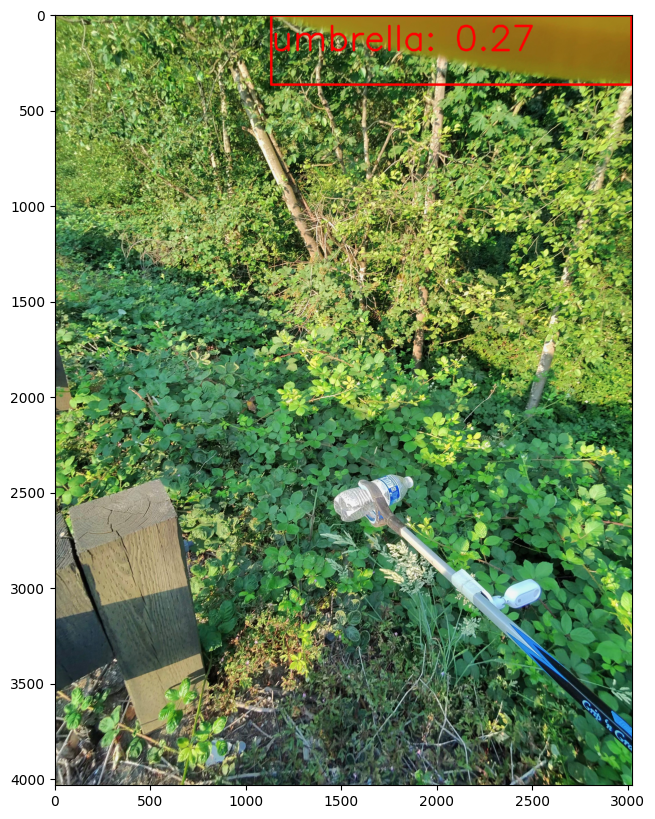

In [6]:
from ultralytics import YOLO
from ultralytics.solutions import object_counter
import cv2
import matplotlib.pyplot as plt
%matplotlib inline
 
def run_inference(image_path, model, font_scale=6,thickness=12):
    # Read the input image
    image = cv2.imread(image_path)
    image_rgb = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)  # Convert BGR to RGB for Matplotlib
    
    print(image.shape)
    
    # Run inference on the image
    results = model(image)

    # Loop through the results and draw bounding boxes
    for result in results:
        for box in result.boxes:
            # Get the bounding box coordinates
            x1, y1, x2, y2 = map(int, box.xyxy[0].cpu().numpy())
            print(f"{x1} {y1} {x2} {y2}")
            
            # Draw the bounding box on the image
            cv2.rectangle(image_rgb, (x1, y1), (x2, y2), (255, 0, 0), 12)  # Red color in RGB
            label_position_x = round(x1)
            label_position_y = round((y1+y2)/2)
            # Get the class label and confidence score
            label = result.names[int(box.cls[0].cpu().numpy())]
            print(f"available class id and label: {result.names}\npredicted class id:")
            print(box.cls[0].cpu().numpy())
            
            confidence = float(box.conf[0].cpu().numpy())
            print(f"confidence {confidence}")
            
            # Draw the label and confidence score on the image with increased text size
            # font_scale = 6   # Increased from 0.5 to 5 for 10x larger text
            # thickness = 12  # Increased thickness for better visibility at larger scale
            cv2.putText(image_rgb, f"{label}: {confidence:.2f}", (label_position_x, label_position_y), cv2.FONT_HERSHEY_SIMPLEX, font_scale, (255, 0, 0), thickness, cv2.LINE_AA)

    # Display the image with bounding boxes using Matplotlib
    plt.figure(figsize=(10,10))
    plt.imshow(image_rgb)
    


# Run the inference
model = YOLO("yolo11n.pt")
plt.clf()
run_inference(image_path, model)    


### The same can be done via cli

In [12]:
!yolo predict model=yolo11n.pt source='litter_survey_dataset/2024-07-21/RayBan/photo-21700_singular_display_fullPicture.jpeg'

Ultralytics 8.3.58 🚀 Python-3.10.12 torch-2.0.1+cu117 CUDA:0 (NVIDIA GeForce RTX 3080 Ti, 12287MiB)
YOLO11n summary (fused): 238 layers, 2,616,248 parameters, 0 gradients, 6.5 GFLOPs

image 1/1 /ultralytics/litter_survey_dataset/2024-07-21/RayBan/photo-21700_singular_display_fullPicture.jpeg: 640x480 1 umbrella, 94.8ms
Speed: 6.4ms preprocess, 94.8ms inference, 3.4ms postprocess per image at shape (1, 3, 640, 480)
Results saved to /ultralytics/runs/detect/predict
💡 Learn more at https://docs.ultralytics.com/modes/predict


# Model Training 
### Refer to https://docs.ultralytics.com/modes/train/#tensorboard

In [13]:
from ultralytics import YOLO

# Load a model
model = YOLO("yolo11n.pt")  # load a pretrained model (recommended for training)

# Train the model
results = model.train(data="coco8.yaml", epochs=3, imgsz=640)

New https://pypi.org/project/ultralytics/8.3.58 available 😃 Update with 'pip install -U ultralytics'
Ultralytics 8.3.57 🚀 Python-3.10.12 torch-2.0.1+cu117 CUDA:0 (NVIDIA GeForce RTX 3080 Ti, 12287MiB)
engine/trainer: task=detect, mode=train, model=yolo11n.pt, data=coco8.yaml, epochs=3, time=None, patience=100, batch=16, imgsz=640, save=True, save_period=-1, cache=False, device=None, workers=8, project=None, name=train, exist_ok=False, pretrained=True, optimizer=auto, verbose=True, seed=0, deterministic=True, single_cls=False, rect=False, cos_lr=False, close_mosaic=10, resume=False, amp=True, fraction=1.0, profile=False, freeze=None, multi_scale=False, overlap_mask=True, mask_ratio=4, dropout=0.0, val=True, split=val, save_json=False, save_hybrid=False, conf=None, iou=0.7, max_det=300, half=False, dnn=False, plots=True, source=None, vid_stride=1, stream_buffer=False, visualize=False, augment=False, agnostic_nms=False, classes=None, retina_masks=False, embed=None, show=False, save_frames

100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 433k/433k [00:00<00:00, 12.5MB/s]
Unzipping /datasets/coco8.zip to /datasets/coco8...: 100%|██████████| 25/25 [00:00<00:00, 4339.05file/s]

Dataset download success ✅ (0.9s), saved to /datasets



100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 755k/755k [00:00<00:00, 12.8MB/s]


                   from  n    params  module                                       arguments                     
  0                  -1  1       464  ultralytics.nn.modules.conv.Conv             [3, 16, 3, 2]                 
  1                  -1  1      4672  ultralytics.nn.modules.conv.Conv             [16, 32, 3, 2]                
  2                  -1  1      6640  ultralytics.nn.modules.block.C3k2            [32, 64, 1, False, 0.25]      
  3                  -1  1     36992  ultralytics.nn.modules.conv.Conv             [64, 64, 3, 2]                
  4                  -1  1     26080  ultralytics.nn.modules.block.C3k2            [64, 128, 1, False, 0.25]     
  5                  -1  1    147712  ultralytics.nn.modules.conv.Conv             [128, 128, 3, 2]              
  6                  -1  1     87040  ultralytics.nn.modules.block.C3k2            [128, 128, 1, True]           
  7                  -1  1    295424  ultralytics.nn.modules.conv.Conv             [128

YOLO11n summary: 319 layers, 2,624,080 parameters, 2,624,064 gradients, 6.6 GFLOPs

Transferred 499/499 items from pretrained weights
Freezing layer 'model.23.dfl.conv.weight'
AMP: running Automatic Mixed Precision (AMP) checks...
AMP: checks passed ✅


train: Scanning /datasets/coco8/labels/train... 4 images, 0 backgrounds, 0 corrupt: 100%|██████████| 4/4 [00:00<00:00, 540.09it/s]

train: New cache created: /datasets/coco8/labels/train.cache



val: Scanning /datasets/coco8/labels/val... 4 images, 0 backgrounds, 0 corrupt: 100%|██████████| 4/4 [00:00<00:00, 598.59it/s]

val: New cache created: /datasets/coco8/labels/val.cache


Plotting labels to /ultralytics/runs/detect/train/labels.jpg... 
optimizer: 'optimizer=auto' found, ignoring 'lr0=0.01' and 'momentum=0.937' and determining best 'optimizer', 'lr0' and 'momentum' automatically... 
optimizer: AdamW(lr=0.000119, momentum=0.9) with parameter groups 81 weight(decay=0.0), 88 weight(decay=0.0005), 87 bias(decay=0.0)
Image sizes 640 train, 640 val
Using 8 dataloader workers
Logging results to /ultralytics/runs/detect/train
Starting training for 3 epochs...

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


        1/3      0.78G      1.092       2.75      1.488         21        640: 100%|██████████| 1/1 [00:01<00:00,  1.29s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:01<00:00,  1.09s/it]

                   all          4         17      0.568       0.85      0.878      0.634



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


        2/3     0.849G      1.186      2.796      1.488         36        640: 100%|██████████| 1/1 [00:00<00:00,  3.80it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00, 13.85it/s]

                   all          4         17      0.557       0.85      0.886      0.635



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


        3/3     0.797G      1.096      2.508      1.219         20        640: 100%|██████████| 1/1 [00:00<00:00,  7.56it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00, 13.95it/s]

                   all          4         17      0.559       0.85      0.851      0.615



3 epochs completed in 0.001 hours.
Optimizer stripped from /ultralytics/runs/detect/train/weights/last.pt, 5.5MB
Optimizer stripped from /ultralytics/runs/detect/train/weights/best.pt, 5.5MB

Validating /ultralytics/runs/detect/train/weights/best.pt...
Ultralytics 8.3.57 🚀 Python-3.10.12 torch-2.0.1+cu117 CUDA:0 (NVIDIA GeForce RTX 3080 Ti, 12287MiB)
YOLO11n summary (fused): 238 layers, 2,616,248 parameters, 0 gradients, 6.5 GFLOPs


                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00, 18.81it/s]


                   all          4         17      0.558       0.85      0.886      0.635
                person          3         10      0.548        0.6      0.592      0.265
                   dog          1          1      0.541          1      0.995      0.697
                 horse          1          2        0.5          1      0.995      0.674
              elephant          1          2      0.358        0.5      0.745      0.281
              umbrella          1          1      0.563          1      0.995      0.995
          potted plant          1          1       0.84          1      0.995      0.895
Speed: 0.4ms preprocess, 4.3ms inference, 0.0ms loss, 1.4ms postprocess per image
Results saved to /ultralytics/runs/detect/train


In [46]:
print('Training success!')

Training success!


### Now try to train using litter survey data

In [69]:
from PIL import Image

def crop_to_largest_square(width, height, x, y):
    """
    Crop the image into the largest possible square containing the point (x, y).

    Args:
        image (PIL.Image.Image): The input image.
        x (int): The x-coordinate of the point.
        y (int): The y-coordinate of the point.

    Returns:
        PIL.Image.Image: The cropped square image.
    """


    # Determine the size of the square
    square_size = int(min(max(2 * x, 2 * (width - x)), max(2 * y, 2 * (height - y))))

    # Ensure the square size does not exceed image dimensions
    square_size = min(square_size, width, height)

    # Calculate the top-left corner of the square
    top_left_x = int(max(0, min(x - square_size // 2, width - square_size)))
    top_left_y = int(max(0, min(y - square_size // 2, height - square_size)))

    # Calculate the bottom-right corner of the square
    bottom_right_x = top_left_x + square_size
    bottom_right_y = top_left_y + square_size

    # Crop the image
    return (square_size, top_left_x, top_left_y, bottom_right_x, bottom_right_y)

In [87]:
# First prepare the labels to normalize them  
import cv2
import os 
import json 

def crop_image_gen_label(img_dir: str, img_file: str, img_height: int, img_width: int, output_size: int = 640, save_bbx: bool = False):
    log(msg=f"{img_height=} by {img_width=}")
    if 'resized' in img_file:
        return 
    json_file = img_file.split('.')[0] + '.json' 
    x1,y1 = 0,0
    x2,y2 = 0,0 
    with open(f'{img_dir}/{json_file}', 'r') as json_file_content:
        json_data = json.load(json_file_content)
        shapes = json_data['shapes']
        for s in shapes:
            if s['label'] == 'Grabber':
                x1,y1 = s['points'][0] 
                x2,y2 = s['points'][1]
                break 
    if x1+y1+x2+y2 == 0:
        # raise Exception("No label found for Grabber!")
        print(f"No label found for Grabber! {img_file}")
        return 
    else:
        log(msg=f'found Grabber label {x1, y1} {x2, y2}')

    img = cv2.imread(f'{img_dir}/{img_file}')

    output_size, top_left_x, top_left_y, bottom_right_x, bottom_right_y = crop_to_largest_square(img_width, img_height, x1, y1)
    log((output_size, top_left_x, top_left_y, bottom_right_x, bottom_right_y))
    cropped_img = img[ top_left_y:bottom_right_y, top_left_x : bottom_right_x] 

    x1 = max(x1 - top_left_x, 0) 
    x2 = x2 - top_left_x 
    y1 = max( y1 - top_left_y, 0)
    y2 = y2 - top_left_y
    
    resized_img = cv2.resize(cropped_img, (output_size, output_size), interpolation=cv2.INTER_LINEAR)
    # new bounding box 
    center_x = (x1+x2)/2 * output_size / min(img_height, img_width) 
    center_y = (y1+y2)/2 * output_size / min(img_height, img_width) 
    box_width = abs(x2-x1) * output_size / min(img_height, img_width) 
    box_height = abs(y2-y1) * output_size / min(img_height, img_width) 

    top_left_x = int(center_x - box_width / 2)
    top_left_y = int(center_y - box_height / 2)
    bottom_right_x = int(center_x + box_width / 2)
    bottom_right_y = int(center_y + box_height / 2)

    log(msg=f'resized bbx {x1, y1} {x2, y2}')
    if save_bbx:
        cv2.rectangle(resized_img, (top_left_x, top_left_y), (bottom_right_x, bottom_right_y), (0, 255, 0), 2)
    cropped_img = img_file.split('.')[0] + '_resized.' + img_file.split('.')[1]
    log(msg=cropped_img)
    cv2.imwrite(f'{img_dir}/{cropped_img}', resized_img)

    label_txt = cropped_img.split('.')[0] + '.txt' 
    with open(f'{img_dir}/{label_txt}', 'w') as txt_file:
        txt_file.write(f'0 {center_x/output_size} {center_y/output_size} {box_width/output_size} {box_height/output_size}')
        log(msg=f'generated normalized: {label_txt} ')

In [88]:
VERBOSE = True

img_dir = '/app/litter_survey_dataset/Annotation Batch 2 Kirkland 20250105'
img_file = 'IMG_20250105_151439_612.jpeg'
img_content = cv2.imread(f'{img_dir}/{img_file}')
img_height, img_width = img_content.shape[:2]
log(img_height, img_width)

crop_image_gen_label(img_dir=img_dir,img_file=img_file,img_height=img_height,img_width=img_width, save_bbx=True)


1440
img_height=1440 by img_width=2560
found Grabber label (1357.98, 1066.6599999999999) (1640.6615680976056, 1435.5099999999998)
(1440, 637, 0, 2077, 1440)
resized bbx (720.98, 1066.6599999999999) (1003.6615680976056, 1435.5099999999998)
IMG_20250105_151439_612_resized.jpeg
generated normalized: IMG_20250105_151439_612_resized.txt 


In [89]:
import os 
import cv2 
VERBOSE = False  

img_ct = 0 
data_batch_folders = [
    '/app/litter_survey_dataset/SampleImageToAnnotate',
    '/app/litter_survey_dataset/Annotation Batch 1 Kirkland 20231216',
    '/app/litter_survey_dataset/Annotation Batch 2 Kirkland 20250105',
    '/app/litter_survey_dataset/Annotation Batch 3 Bellevue Woodinville 20240721',
    '/app/litter_survey_dataset/Annotation Batch 4 Kirkland 20240310'
]

rejected_imgs = ['photo-9994_singular_display_fullPicture.jpeg', 
                 'photo-20117_singular_display_fullPicture.jpeg',
                 'photo-3413_singular_display_fullPicture.jpeg',
                 'photo-3617_singular_display_fullPicture.jpeg',
                 'photo-3644_singular_display_fullPicture.jpeg',
                 'photo-3644_singular_display_fullPicture.jpeg',
                 'photo-3686_singular_display_fullPicture.jpeg',
                 'photo-3692_singular_display_fullPicture.jpeg',
                 'photo-4455_singular_display_fullPicture.jpeg',
                 'photo-4479_singular_display_fullPicture.jpeg',

                'photo-14680_singular_display_fullPicture_resized.jpeg',
                'photo-3479_singular_display_fullPicture_resized.jpeg',
                'photo-3593_singular_display_fullPicture_resized.jpeg',
                'photo-3599_singular_display_fullPicture_resized.jpeg',
                'photo-3614_singular_display_fullPicture_resized.jpeg',
                'photo-3659_singular_display_fullPicture_resized.jpeg',
                'photo-4464_singular_display_fullPicture_resized.jpeg',
                'photo-4474_singular_display_fullPicture_resized.jpeg',
                'photo-4557_singular_display_fullPicture_resized.jpeg',

                'IMG_1821_resized.jpeg',
                'photo-3560_singular_display_fullPicture_resized.jpeg',
]

for data_batch_folder in data_batch_folders:
    
    img_dirs = [data_batch_folder, data_batch_folder.replace('/app/','')]
    for img_dir in img_dirs:
        all_labeled_images = os.listdir(img_dir)

        for img_file in all_labeled_images:
            if img_file.endswith('.jpeg'):
                img_ct += 1 
                log(img_file)
                log(img_ct)
                img_content = cv2.imread(f'{img_dir}/{img_file}')
                img_height, img_width = img_content.shape[:2]
                log(f'{ img_height, img_width}')
                if img_file not in rejected_imgs:
                    crop_image_gen_label(img_dir=img_dir,img_file=img_file,img_height=img_height,img_width=img_width, save_bbx=False)

No label found for Grabber! photo-10242_singular_display_fullPicture.jpeg
No label found for Grabber! photo-10245_singular_display_fullPicture.jpeg
No label found for Grabber! photo-7715_singular_display_fullPicture.jpeg
No label found for Grabber! photo-7715_singular_display_fullPicture.jpeg
No label found for Grabber! photo-10242_singular_display_fullPicture.jpeg
No label found for Grabber! photo-10245_singular_display_fullPicture.jpeg


In [7]:
import os
import shutil


def copy_to_train_dataset(img_dir: str, img_file: str, label_type: str, label_dir: str = '/app/train_dataset'):
    
    source_img = f"{img_dir}/{img_file}"
    destination_img = f"{label_dir}/images/{label_type}/{img_file}"

    label_file = img_file.split('.')[0] + '.txt' 
    source_label = f"{img_dir}/{label_file}"
    destination_label = f"{label_dir}/labels/{label_type}/{label_file}"
    
    # Copy the file
    shutil.copy(source_img, destination_img)
    log(f'copied to {destination_img}') 
    shutil.copy(source_label, destination_label)
    log(f'copied to {destination_label}') 

In [13]:

!rm -rf /app/train_dataset/images/train
!rm -rf /app/train_dataset/images/val

In [14]:
!mkdir /app/train_dataset/images/val

In [15]:
!mkdir /app/train_dataset/images/train

In [16]:
!ls /app/train_dataset/images

train  val


In [17]:
import random

print('in progress')
VERBOSE = False
total_eval = 0
total_train = 0 
data_batch_folders = [
    '/app/litter_survey_dataset/SampleImageToAnnotate',
    '/app/litter_survey_dataset/Annotation Batch 1 Kirkland 20231216',
    '/app/litter_survey_dataset/Annotation Batch 2 Kirkland 20250105',
    '/app/litter_survey_dataset/Annotation Batch 3 Bellevue Woodinville 20240721',
    '/app/litter_survey_dataset/Annotation Batch 4 Kirkland 20240310'
]
rejected_imgs = ['photo-9994_singular_display_fullPicture.jpeg', 
                 'photo-20117_singular_display_fullPicture.jpeg',
                 'photo-3413_singular_display_fullPicture.jpeg',
                 'photo-3617_singular_display_fullPicture.jpeg',
                 'photo-3644_singular_display_fullPicture.jpeg',
                 'photo-3644_singular_display_fullPicture.jpeg',
                 'photo-3686_singular_display_fullPicture.jpeg',
                 'photo-3692_singular_display_fullPicture.jpeg',
                 'photo-4455_singular_display_fullPicture.jpeg',
                 'photo-4479_singular_display_fullPicture.jpeg',

                'photo-14680_singular_display_fullPicture_resized.jpeg',
                'photo-3479_singular_display_fullPicture_resized.jpeg',
                'photo-3593_singular_display_fullPicture_resized.jpeg',
                'photo-3599_singular_display_fullPicture_resized.jpeg',
                'photo-3614_singular_display_fullPicture_resized.jpeg',
                'photo-3659_singular_display_fullPicture_resized.jpeg',
                'photo-4464_singular_display_fullPicture_resized.jpeg',
                'photo-4474_singular_display_fullPicture_resized.jpeg',
                'photo-4557_singular_display_fullPicture_resized.jpeg',

                'IMG_1821_resized.jpeg',
                'photo-3560_singular_display_fullPicture_resized.jpeg',

                'photo-10242_singular_display_fullPicture.jpeg',
                'photo-10245_singular_display_fullPicture.jpeg',
                'photo-7715_singular_display_fullPicture.jpeg',
                'photo-7715_singular_display_fullPicture.jpeg',
                'photo-10242_singular_display_fullPicture.jpeg',
                'photo-10245_singular_display_fullPicture.jpeg',
]

all_labeled_images = []
for data_batch_folder in data_batch_folders:
    
    img_dirs = [data_batch_folder]
    for img_dir in img_dirs:
        for img_file in os.listdir(img_dir):
            if 'resized' in img_file and img_file not in rejected_imgs:
                all_labeled_images.append(img_file)
                log(img_file)
                if random.randint(0, 100) < 15 :
                     copy_to_train_dataset(img_dir=img_dir,img_file=img_file, label_type = 'val', label_dir='/app/train_dataset')
                     total_eval+=1
                else:
                    copy_to_train_dataset(img_dir=img_dir,img_file=img_file, label_type = 'train', label_dir='/app/train_dataset')
                    total_train+=1 
    print(f'{total_eval=}, {total_train=}')


in progress
total_eval=14, total_train=54
total_eval=89, total_train=424
total_eval=151, total_train=828
total_eval=213, total_train=1188
total_eval=294, total_train=1721


In [18]:

# Specify the dataset directory
dataset_dir = "/app/train_dataset/labels"

# Define cache files to remove
train_cache = os.path.join(dataset_dir, 'train.cache')
val_cache = os.path.join(dataset_dir, 'val.cache')

# Remove cache files if they exist
for cache_file in [train_cache, val_cache]:
    if os.path.exists(cache_file):
        os.remove(cache_file)
        print(f"Removed cache file: {cache_file}")
    else:
        print(f"Cache file does not exist: {cache_file}")

Removed cache file: /app/train_dataset/labels/train.cache
Removed cache file: /app/train_dataset/labels/val.cache


In [19]:
from ultralytics import YOLO

model = YOLO('yolo11n.pt')
data_yaml = '/app/train_dataset/train_dataset.yaml'
print(f"Loading dataset: {data_yaml}")

Loading dataset: /app/train_dataset/train_dataset.yaml


In [20]:
import torch
print(torch.__version__)

2.0.1+cu117


In [21]:
# !pip install torch torchvision torchaudio --index-url https://download.pytorch.org/whl/cu117

In [22]:
import torch
print(torch.__version__)

2.0.1+cu117


In [23]:

model.train(data=data_yaml, epochs=50, imgsz=640, batch=6, device='cuda', augment=True)
# model.train(data=data_yaml, epochs=15, imgsz=640, batch=5, device='cuda', augment=True)

New https://pypi.org/project/ultralytics/8.3.61 available 😃 Update with 'pip install -U ultralytics'
Ultralytics 8.3.57 🚀 Python-3.10.12 torch-2.0.1+cu117 CUDA:0 (NVIDIA GeForce RTX 3080 Ti, 12287MiB)
engine/trainer: task=detect, mode=train, model=yolo11n.pt, data=/app/train_dataset/train_dataset.yaml, epochs=50, time=None, patience=100, batch=6, imgsz=640, save=True, save_period=-1, cache=False, device=cuda, workers=8, project=None, name=train3, exist_ok=False, pretrained=True, optimizer=auto, verbose=True, seed=0, deterministic=True, single_cls=False, rect=False, cos_lr=False, close_mosaic=10, resume=False, amp=True, fraction=1.0, profile=False, freeze=None, multi_scale=False, overlap_mask=True, mask_ratio=4, dropout=0.0, val=True, split=val, save_json=False, save_hybrid=False, conf=None, iou=0.7, max_det=300, half=False, dnn=False, plots=True, source=None, vid_stride=1, stream_buffer=False, visualize=False, augment=True, agnostic_nms=False, classes=None, retina_masks=False, embed=No

train: Scanning /app/train_dataset/labels/train... 841 images, 0 backgrounds, 0 corrupt: 100%|██████████| 841/841 [00:02<00:00, 417.33it/s]


train: New cache created: /app/train_dataset/labels/train.cache


val: Scanning /app/train_dataset/labels/val... 150 images, 0 backgrounds, 0 corrupt: 100%|██████████| 150/150 [00:00<00:00, 184.16it/s]


val: New cache created: /app/train_dataset/labels/val.cache
Plotting labels to /ultralytics/runs/detect/train3/labels.jpg... 
optimizer: 'optimizer=auto' found, ignoring 'lr0=0.01' and 'momentum=0.937' and determining best 'optimizer', 'lr0' and 'momentum' automatically... 
optimizer: AdamW(lr=0.002, momentum=0.9) with parameter groups 81 weight(decay=0.0), 88 weight(decay=0.000515625), 87 bias(decay=0.0)
Image sizes 640 train, 640 val
Using 8 dataloader workers
Logging results to /ultralytics/runs/detect/train3
Starting training for 50 epochs...

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       1/50      1.08G      1.357      3.012      1.193          2        640: 100%|██████████| 141/141 [01:31<00:00,  1.53it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 13/13 [00:03<00:00,  3.84it/s]

                   all        150        150      0.952      0.791      0.889      0.657



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       2/50       1.1G      1.151       1.79      1.104          2        640: 100%|██████████| 141/141 [01:19<00:00,  1.76it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 13/13 [00:02<00:00,  5.03it/s]

                   all        150        150      0.911      0.814       0.87      0.645



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       3/50      1.11G        1.1      1.423       1.08          4        640: 100%|██████████| 141/141 [01:27<00:00,  1.62it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 13/13 [00:02<00:00,  4.58it/s]

                   all        150        150      0.943       0.77      0.881      0.681



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       4/50      1.11G      1.056      1.166      1.075          0        640: 100%|██████████| 141/141 [01:20<00:00,  1.75it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 13/13 [00:02<00:00,  4.75it/s]


                   all        150        150      0.964      0.891      0.947      0.737

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       5/50      1.11G      1.009      1.046      1.037          0        640: 100%|██████████| 141/141 [01:22<00:00,  1.71it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 13/13 [00:02<00:00,  5.79it/s]

                   all        150        150      0.985      0.872       0.93      0.752



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       6/50      1.11G     0.9408     0.8668      1.009          4        640: 100%|██████████| 141/141 [01:22<00:00,  1.71it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 13/13 [00:02<00:00,  4.53it/s]


                   all        150        150      0.982        0.9      0.951      0.774

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       7/50      1.11G     0.9128     0.8068      1.004          2        640: 100%|██████████| 141/141 [01:20<00:00,  1.75it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 13/13 [00:02<00:00,  5.12it/s]

                   all        150        150      0.978      0.895      0.956      0.777



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       8/50      1.11G     0.8955     0.7594     0.9891          4        640: 100%|██████████| 141/141 [01:25<00:00,  1.65it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 13/13 [00:03<00:00,  4.16it/s]

                   all        150        150      0.979      0.925      0.967      0.792



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       9/50      1.11G     0.8625     0.7102     0.9856          1        640: 100%|██████████| 141/141 [01:24<00:00,  1.67it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 13/13 [00:02<00:00,  5.17it/s]

                   all        150        150      0.972      0.913      0.958      0.781



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      10/50      1.11G     0.8695     0.6973     0.9685          0        640: 100%|██████████| 141/141 [01:24<00:00,  1.66it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 13/13 [00:02<00:00,  4.52it/s]

                   all        150        150      0.966      0.937      0.969      0.811



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      11/50      1.11G     0.8452     0.6354     0.9723          4        640: 100%|██████████| 141/141 [01:22<00:00,  1.70it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 13/13 [00:02<00:00,  5.77it/s]

                   all        150        150      0.962      0.933      0.984       0.77



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      12/50       1.1G     0.8276     0.6108     0.9572          1        640: 100%|██████████| 141/141 [01:24<00:00,  1.66it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 13/13 [00:02<00:00,  5.96it/s]

                   all        150        150      0.961      0.927      0.975      0.824



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      13/50      1.11G     0.7881     0.5904     0.9545          1        640: 100%|██████████| 141/141 [01:22<00:00,  1.71it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 13/13 [00:02<00:00,  5.20it/s]


                   all        150        150      0.986      0.932      0.976      0.832

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      14/50      1.11G     0.8209     0.5972     0.9557          1        640: 100%|██████████| 141/141 [01:22<00:00,  1.71it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 13/13 [00:02<00:00,  4.70it/s]

                   all        150        150      0.986      0.947       0.98      0.829



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      15/50      1.11G     0.7761     0.5815     0.9362          0        640: 100%|██████████| 141/141 [01:22<00:00,  1.71it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 13/13 [00:02<00:00,  5.44it/s]

                   all        150        150      0.986      0.938      0.981      0.822



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      16/50      1.11G      0.782     0.5636      0.956          1        640: 100%|██████████| 141/141 [01:22<00:00,  1.71it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 13/13 [00:02<00:00,  4.77it/s]

                   all        150        150      0.988       0.94      0.985      0.831



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      17/50      1.11G     0.7527     0.5497     0.9403          3        640: 100%|██████████| 141/141 [01:22<00:00,  1.70it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 13/13 [00:02<00:00,  5.84it/s]

                   all        150        150      0.986      0.971      0.981      0.844



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      18/50      1.11G     0.7467     0.5371     0.9295          1        640: 100%|██████████| 141/141 [01:22<00:00,  1.72it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 13/13 [00:02<00:00,  5.28it/s]

                   all        150        150      0.969       0.96      0.977       0.83



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      19/50      1.11G      0.726     0.5375     0.9292          2        640: 100%|██████████| 141/141 [01:27<00:00,  1.61it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 13/13 [00:02<00:00,  4.75it/s]

                   all        150        150      0.979      0.953      0.981      0.847



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      20/50      1.11G     0.7375       0.53     0.9441          1        640: 100%|██████████| 141/141 [01:26<00:00,  1.62it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 13/13 [00:02<00:00,  5.17it/s]

                   all        150        150      0.973      0.963       0.98      0.861



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      21/50      1.11G     0.7084     0.5055     0.9158          1        640: 100%|██████████| 141/141 [01:31<00:00,  1.54it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 13/13 [00:01<00:00,  7.72it/s]

                   all        150        150      0.964       0.96      0.979      0.849



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      22/50      1.11G     0.7144     0.5137     0.9278          1        640: 100%|██████████| 141/141 [01:26<00:00,  1.63it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 13/13 [00:02<00:00,  5.12it/s]

                   all        150        150      0.966      0.951       0.98      0.856



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      23/50       1.1G     0.6984     0.5017     0.9282          4        640: 100%|██████████| 141/141 [01:21<00:00,  1.73it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 13/13 [00:02<00:00,  5.11it/s]

                   all        150        150       0.98      0.979      0.993      0.859



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      24/50      1.11G     0.6812     0.4885     0.9189          1        640: 100%|██████████| 141/141 [01:25<00:00,  1.65it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 13/13 [00:02<00:00,  5.34it/s]

                   all        150        150      0.973      0.978      0.993       0.88



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      25/50      1.11G     0.6845       0.48     0.9085          4        640: 100%|██████████| 141/141 [01:26<00:00,  1.64it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 13/13 [00:02<00:00,  5.50it/s]

                   all        150        150      0.986      0.966      0.993      0.861



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      26/50      1.11G     0.6725     0.4695     0.9092          1        640: 100%|██████████| 141/141 [01:22<00:00,  1.72it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 13/13 [00:02<00:00,  5.26it/s]

                   all        150        150      0.992      0.967      0.991      0.875



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      27/50      1.11G     0.6691     0.4594      0.911          1        640: 100%|██████████| 141/141 [01:25<00:00,  1.65it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 13/13 [00:02<00:00,  5.59it/s]

                   all        150        150      0.984      0.967      0.984       0.87



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      28/50      1.11G     0.6465     0.4607     0.8955          4        640: 100%|██████████| 141/141 [01:20<00:00,  1.75it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 13/13 [00:02<00:00,  4.93it/s]

                   all        150        150      0.973      0.967      0.993      0.885



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      29/50      1.11G     0.6475     0.4454     0.8995          2        640: 100%|██████████| 141/141 [01:24<00:00,  1.66it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 13/13 [00:02<00:00,  5.49it/s]

                   all        150        150      0.993      0.973      0.987      0.876



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      30/50      1.11G     0.6392     0.4417     0.9042          1        640: 100%|██████████| 141/141 [01:24<00:00,  1.67it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 13/13 [00:02<00:00,  5.22it/s]

                   all        150        150          1      0.977      0.987      0.883



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      31/50      1.11G     0.6327     0.4313     0.9012          1        640: 100%|██████████| 141/141 [01:23<00:00,  1.69it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 13/13 [00:02<00:00,  5.29it/s]

                   all        150        150      0.993      0.986      0.994      0.888



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      32/50      1.11G      0.651     0.4443      0.901          0        640: 100%|██████████| 141/141 [01:25<00:00,  1.66it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 13/13 [00:02<00:00,  4.70it/s]

                   all        150        150      0.993      0.979      0.994      0.888



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      33/50      1.11G     0.6374     0.4475     0.9063          1        640: 100%|██████████| 141/141 [01:31<00:00,  1.54it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 13/13 [00:02<00:00,  4.93it/s]

                   all        150        150      0.973      0.987      0.987      0.873



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      34/50       1.1G     0.6399     0.4244     0.9074          2        640: 100%|██████████| 141/141 [01:24<00:00,  1.67it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 13/13 [00:02<00:00,  4.72it/s]

                   all        150        150      0.991       0.98      0.994      0.902



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      35/50      1.11G     0.6161     0.4323     0.8831          0        640: 100%|██████████| 141/141 [01:25<00:00,  1.65it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 13/13 [00:02<00:00,  5.11it/s]

                   all        150        150      0.985       0.98      0.994       0.88



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      36/50      1.11G     0.5912     0.3929     0.8895          1        640: 100%|██████████| 141/141 [01:28<00:00,  1.60it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 13/13 [00:02<00:00,  5.10it/s]

                   all        150        150      0.998      0.987      0.994      0.902



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      37/50      1.11G     0.5945     0.3983     0.8835          1        640: 100%|██████████| 141/141 [01:23<00:00,  1.69it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 13/13 [00:02<00:00,  4.59it/s]

                   all        150        150      0.991      0.993      0.995      0.902



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      38/50      1.11G     0.5988      0.407     0.8932          1        640: 100%|██████████| 141/141 [01:30<00:00,  1.56it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 13/13 [00:02<00:00,  4.67it/s]

                   all        150        150      0.987      0.993      0.995      0.901



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      39/50      1.11G     0.5992     0.4008     0.8869          1        640: 100%|██████████| 141/141 [01:22<00:00,  1.71it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 13/13 [00:02<00:00,  4.57it/s]

                   all        150        150          1      0.986      0.995       0.91



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      40/50      1.11G     0.5794     0.3847     0.8826          1        640: 100%|██████████| 141/141 [01:27<00:00,  1.61it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 13/13 [00:02<00:00,  5.35it/s]

                   all        150        150          1      0.989      0.995      0.894


Closing dataloader mosaic

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      41/50      1.11G     0.4856     0.3169     0.8447          1        640: 100%|██████████| 141/141 [01:23<00:00,  1.69it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 13/13 [00:03<00:00,  3.62it/s]

                   all        150        150      0.998       0.98      0.994       0.91



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      42/50      1.11G     0.4752     0.3097     0.8451          1        640: 100%|██████████| 141/141 [01:19<00:00,  1.77it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 13/13 [00:02<00:00,  4.63it/s]

                   all        150        150          1      0.977      0.991      0.904



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      43/50      1.11G     0.4583     0.2985      0.834          1        640: 100%|██████████| 141/141 [01:22<00:00,  1.70it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 13/13 [00:02<00:00,  4.60it/s]

                   all        150        150      0.998      0.987      0.994      0.909



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      44/50      1.11G     0.4618     0.2965     0.8277          1        640: 100%|██████████| 141/141 [01:22<00:00,  1.70it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 13/13 [00:04<00:00,  3.00it/s]

                   all        150        150          1      0.985      0.995      0.919



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      45/50       1.1G     0.4456     0.2872     0.8419          1        640: 100%|██████████| 141/141 [01:22<00:00,  1.72it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 13/13 [00:02<00:00,  5.69it/s]

                   all        150        150      0.999      0.987      0.995      0.912



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      46/50      1.11G     0.4428     0.2862     0.8169          1        640: 100%|██████████| 141/141 [01:22<00:00,  1.72it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 13/13 [00:02<00:00,  4.59it/s]

                   all        150        150      0.997      0.987      0.995      0.919



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      47/50      1.11G     0.4447     0.2847     0.8295          1        640: 100%|██████████| 141/141 [01:21<00:00,  1.72it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 13/13 [00:02<00:00,  5.73it/s]

                   all        150        150          1       0.98      0.995      0.925



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      48/50      1.11G     0.4418     0.2806      0.824          1        640: 100%|██████████| 141/141 [01:21<00:00,  1.74it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 13/13 [00:02<00:00,  5.55it/s]

                   all        150        150          1       0.98      0.994       0.92



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      49/50      1.11G     0.4306     0.2762     0.8211          1        640: 100%|██████████| 141/141 [01:23<00:00,  1.69it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 13/13 [00:02<00:00,  5.54it/s]

                   all        150        150          1      0.986      0.995      0.922



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      50/50      1.11G      0.416     0.2736     0.8199          1        640: 100%|██████████| 141/141 [01:18<00:00,  1.79it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 13/13 [00:02<00:00,  5.36it/s]

                   all        150        150          1      0.986      0.995      0.919



50 epochs completed in 1.223 hours.
Optimizer stripped from /ultralytics/runs/detect/train3/weights/last.pt, 5.5MB
Optimizer stripped from /ultralytics/runs/detect/train3/weights/best.pt, 5.5MB

Validating /ultralytics/runs/detect/train3/weights/best.pt...
Ultralytics 8.3.57 🚀 Python-3.10.12 torch-2.0.1+cu117 CUDA:0 (NVIDIA GeForce RTX 3080 Ti, 12287MiB)
YOLO11n summary (fused): 238 layers, 2,582,347 parameters, 0 gradients, 6.3 GFLOPs


                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 13/13 [00:21<00:00,  1.63s/it]


                   all        150        150      0.984      0.987      0.995       0.91
Speed: 0.9ms preprocess, 28.2ms inference, 0.0ms loss, 9.8ms postprocess per image
Results saved to /ultralytics/runs/detect/train3


ultralytics.utils.metrics.DetMetrics object with attributes:

ap_class_index: array([0])
box: ultralytics.utils.metrics.Metric object
confusion_matrix: <ultralytics.utils.metrics.ConfusionMatrix object at 0x7ff108069630>
curves: ['Precision-Recall(B)', 'F1-Confidence(B)', 'Precision-Confidence(B)', 'Recall-Confidence(B)']
curves_results: [[array([          0,    0.001001,    0.002002,    0.003003,    0.004004,    0.005005,    0.006006,    0.007007,    0.008008,    0.009009,     0.01001,    0.011011,    0.012012,    0.013013,    0.014014,    0.015015,    0.016016,    0.017017,    0.018018,    0.019019,     0.02002,    0.021021,    0.022022,    0.023023,
          0.024024,    0.025025,    0.026026,    0.027027,    0.028028,    0.029029,     0.03003,    0.031031,    0.032032,    0.033033,    0.034034,    0.035035,    0.036036,    0.037037,    0.038038,    0.039039,     0.04004,    0.041041,    0.042042,    0.043043,    0.044044,    0.045045,    0.046046,    0.047047,
          0.048048, 

In [ ]:
print('training success!')

### After model train success, try predict using it

(4032, 3024, 3)

0: 640x480 1 Grabber, 18.6ms
Speed: 4.0ms preprocess, 18.6ms inference, 2.6ms postprocess per image at shape (1, 3, 640, 480)
1473 2275 2082 2782
available class id and label: {0: 'Grabber'}
predicted class id:
0.0
confidence 0.9402638077735901


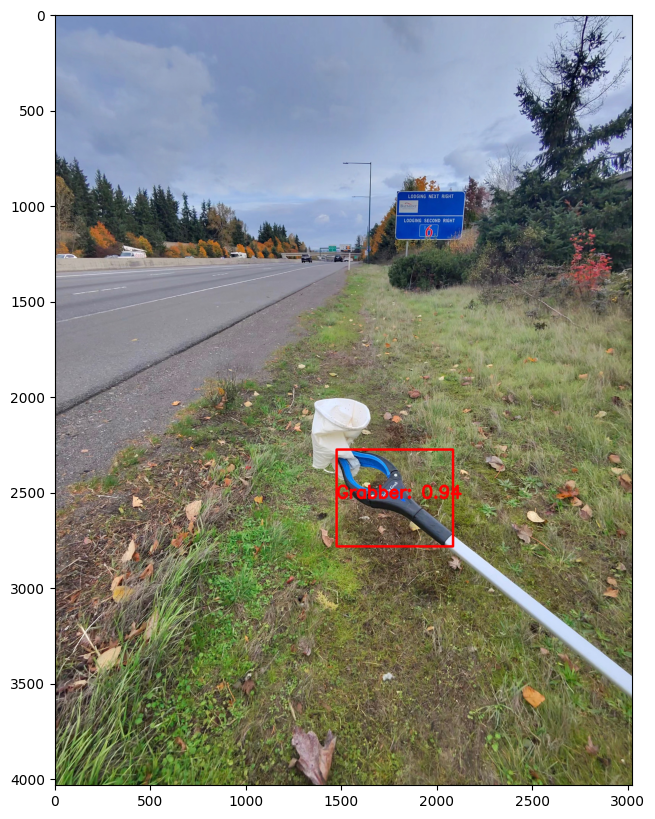

In [38]:
from ultralytics import YOLO
%matplotlib inline

# Load the trained model
model = YOLO('runs/detect/train/weights/best.pt')  # Replace with the path to your trained model
# image_path = 'train_dataset/images/train/A664F919-BBD0-4DB1-A5EB-011EC61D6B28_1_105_c_resized.jpeg'
image_path = 'litter_survey_dataset/2024-07-21/RayBan/photo-1007_singular_display_fullPicture.jpeg'

run_inference(image_path, model, font_scale = 3)

C6AAB516-32E8-47B4-B331-934AC91FD45C_1_105_c.jpeg
(1024, 768, 3)

0: 640x480 1 Grabber, 43.6ms
Speed: 4.2ms preprocess, 43.6ms inference, 15.7ms postprocess per image at shape (1, 3, 640, 480)
166 942 240 1023
available class id and label: {0: 'Grabber'}
predicted class id:
0.0
confidence 0.9164009690284729
photo-21659_singular_display_fullPicture.jpeg
(3489, 2617, 3)

0: 640x480 1 Grabber, 34.8ms
Speed: 4.5ms preprocess, 34.8ms inference, 10.2ms postprocess per image at shape (1, 3, 640, 480)
1467 1926 2050 2271
available class id and label: {0: 'Grabber'}
predicted class id:
0.0
confidence 0.9129863381385803
photo-2917_singular_display_fullPicture.jpeg
(4032, 3024, 3)

0: 640x480 1 Grabber, 21.0ms
Speed: 4.2ms preprocess, 21.0ms inference, 8.6ms postprocess per image at shape (1, 3, 640, 480)
1584 2457 1740 2589
available class id and label: {0: 'Grabber'}
predicted class id:
0.0
confidence 0.8706503510475159
photo-21700_singular_display_fullPicture.jpeg
(4032, 3024, 3)

0: 640x480 1

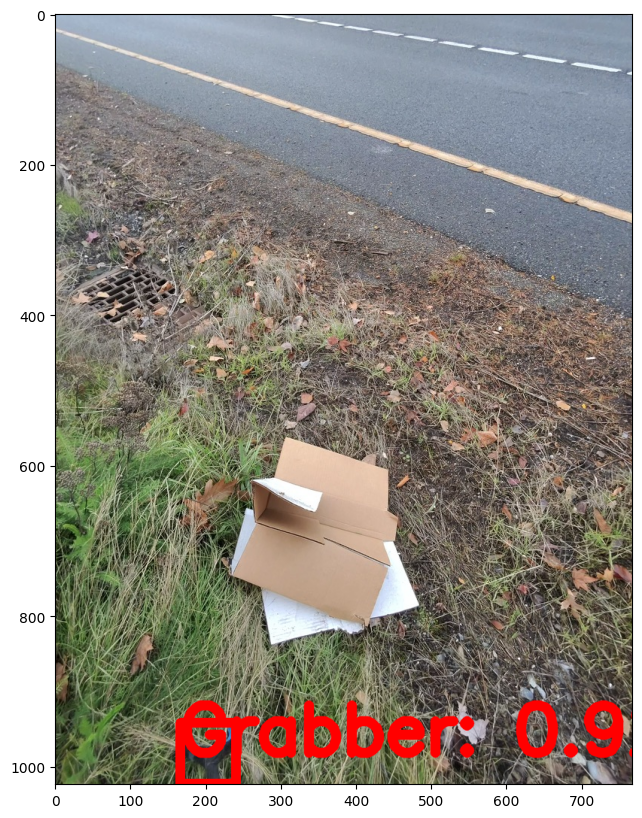

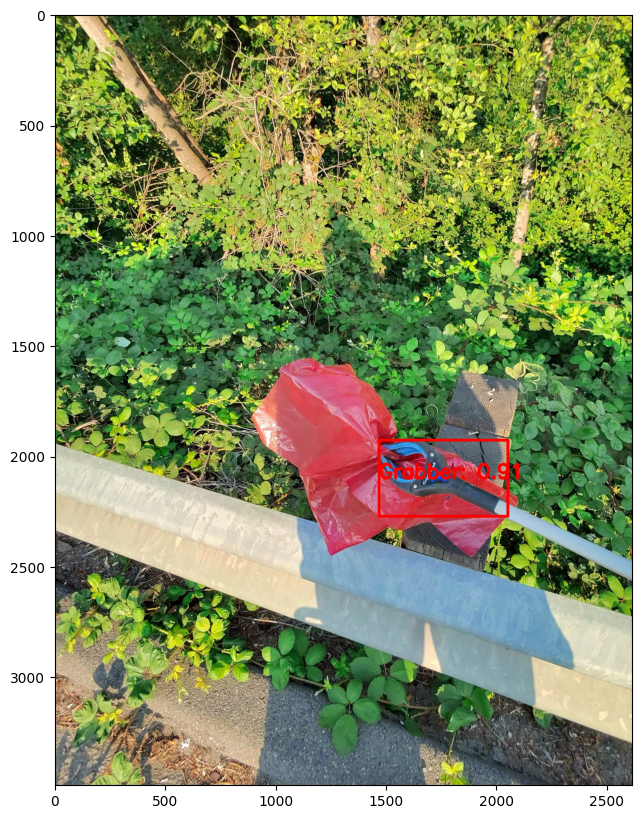

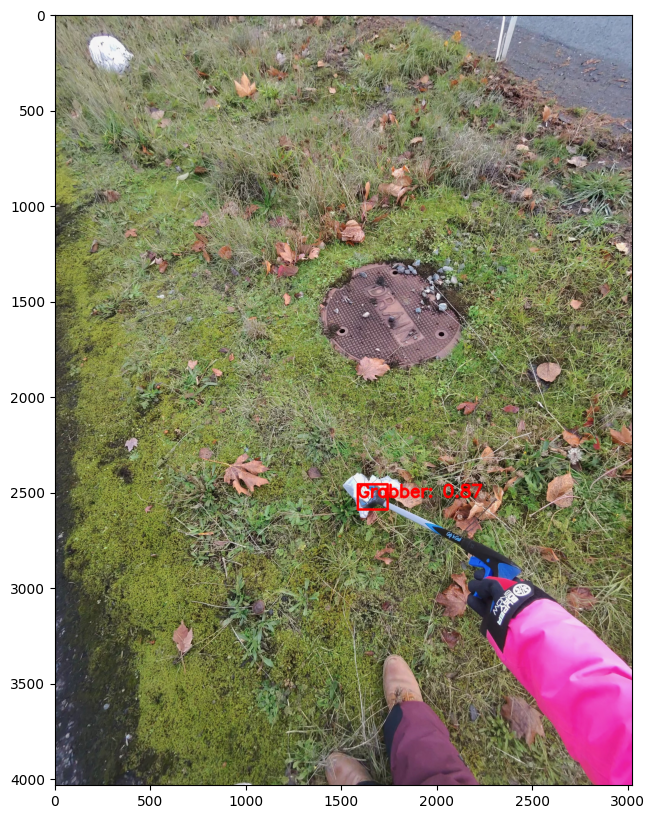

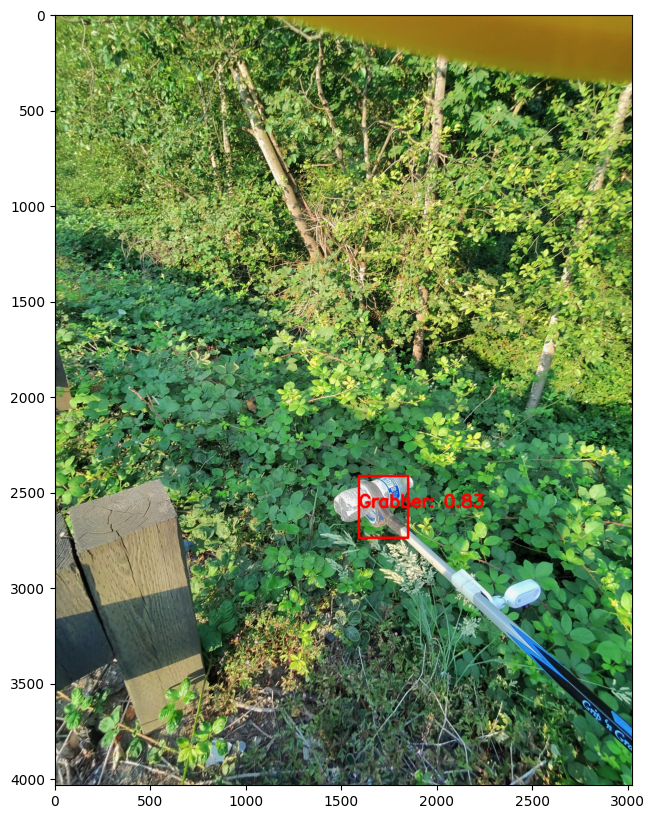

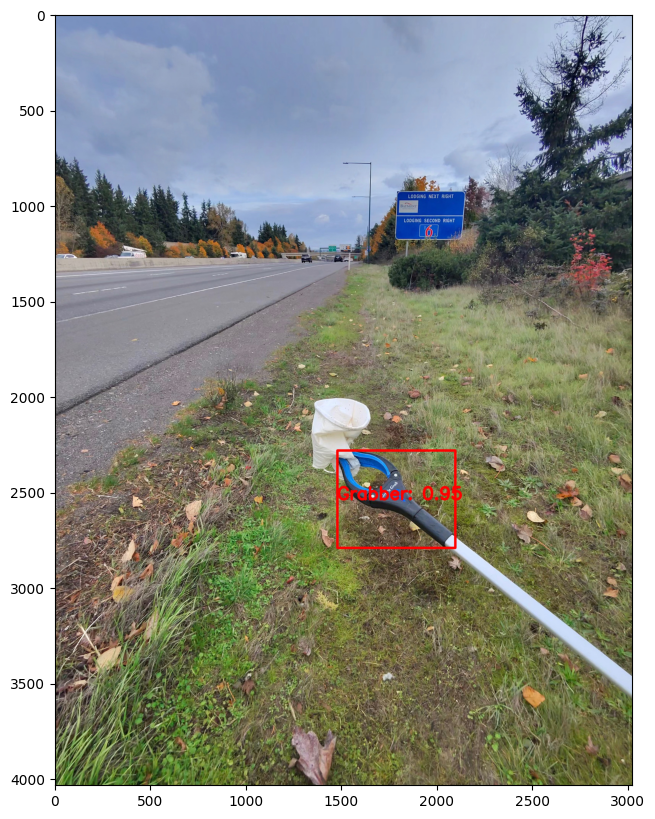

In [36]:
import os 
unseen_images = os.listdir('litter_survey_dataset/2024-07-21/RayBan')
for unseen_image in unseen_images:
    print(unseen_image)
    if unseen_image.endswith('jpeg'):
        image_path = f'litter_survey_dataset/2024-07-21/RayBan/{unseen_image}'
        
        run_inference(image_path, model, font_scale = 3)


VID_20240721_082140_00_096_001_00001042.jpg
(1440, 2560, 3)

0: 384x640 1 Grabber, 63.4ms
Speed: 3.2ms preprocess, 63.4ms inference, 5.1ms postprocess per image at shape (1, 3, 384, 640)
1262 1019 1547 1272
available class id and label: {0: 'Grabber'}
predicted class id:
0.0
confidence 0.8467444777488708
VID_20240721_082140_00_096_001_00000101.jpg
(1440, 2560, 3)

0: 384x640 (no detections), 35.7ms
Speed: 3.6ms preprocess, 35.7ms inference, 4.8ms postprocess per image at shape (1, 3, 384, 640)
VID_20240721_082140_00_096_001_00000645.jpg
(1440, 2560, 3)

0: 384x640 (no detections), 33.3ms
Speed: 3.4ms preprocess, 33.3ms inference, 4.3ms postprocess per image at shape (1, 3, 384, 640)
VID_20240721_082140_00_096_001_00000026.jpg
(1440, 2560, 3)

0: 384x640 1 Grabber, 12.1ms
Speed: 3.2ms preprocess, 12.1ms inference, 3.4ms postprocess per image at shape (1, 3, 384, 640)
1212 1037 1470 1273
available class id and label: {0: 'Grabber'}
predicted class id:
0.0
confidence 0.2657059133052826


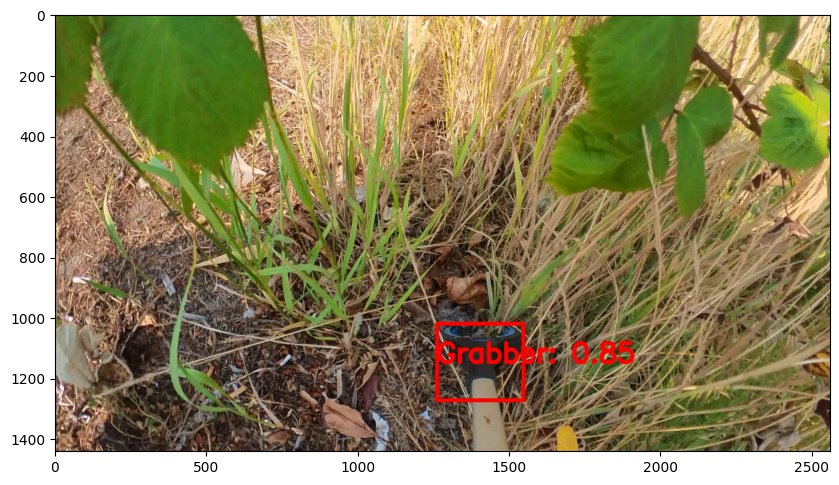

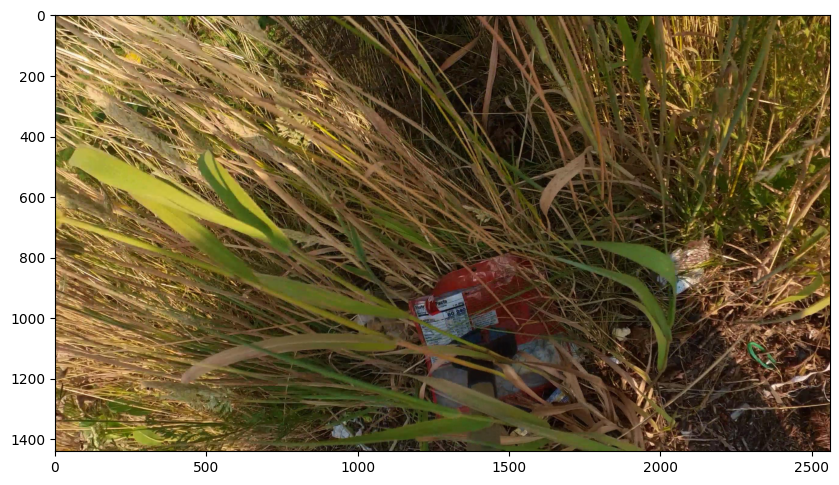

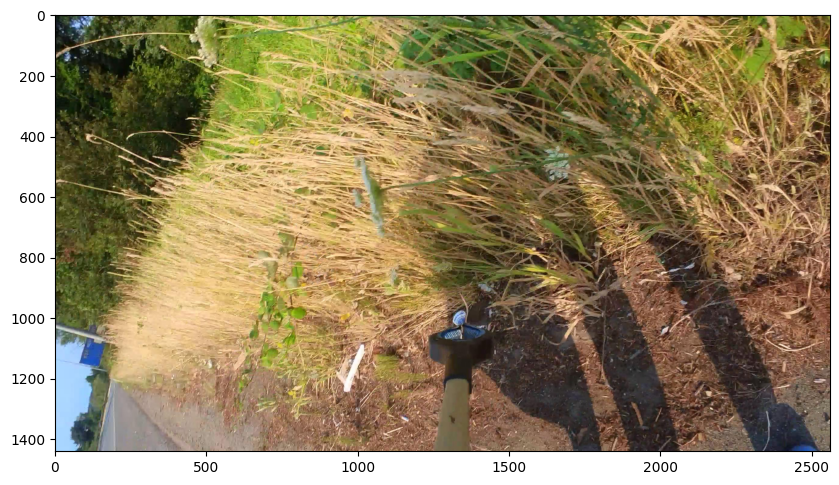

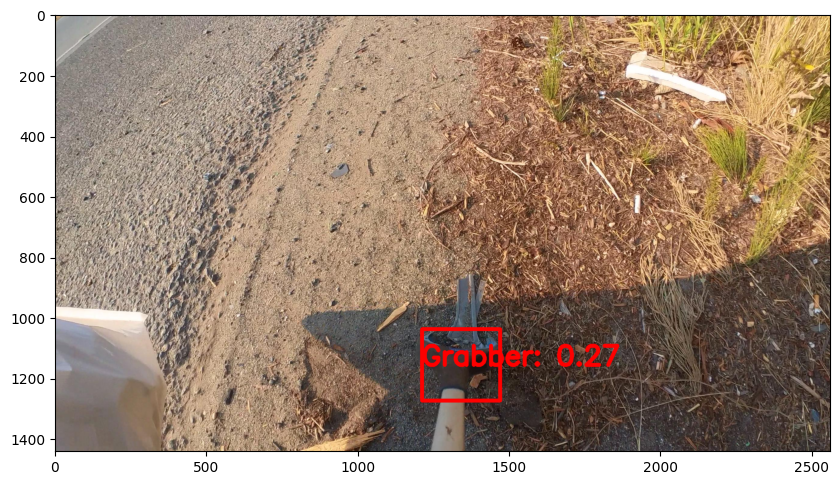

In [39]:
import os 
unseen_images = os.listdir('litter_survey_dataset/2024-07-21/Insta360')
for unseen_image in unseen_images:
    print(unseen_image)
    if unseen_image.endswith('jpg'):
        image_path = f'litter_survey_dataset/2024-07-21/Insta360/{unseen_image}'
        
        run_inference(image_path, model, font_scale = 3)
